# Ejercicio de programación Regresión Lineal

In [2]:
# utilizado para manejos de directorios y rutas
import os

# Computacion vectorial y cientifica para python
import numpy as np

# Librerias para graficación (trazado de gráficos)
from matplotlib import pyplot
from mpl_toolkits.mplot3d import Axes3D  # Necesario para graficar superficies 3D
import pandas as pd

# llama a matplotlib a embeber graficas dentro de los cuadernillos
%matplotlib inline

## 1 Regresión lineal con una variable

El archivo `Data/ex1data1.txt` contiene el dataset para el problema de regresion lineal. La primera columna es la problacion de una ciudad (en 10,000s) y la segunda columna es el beneficio que genera un camion de comida en esa ciudad (en $10,000s). Un valor negativo indica una perdida.

In [2]:
from google.colab import drive
drive.mount('/content/drive')

ModuleNotFoundError: No module named 'google.colab'

In [3]:
# Descargar el archivo CSV desde la URL proporcionada y convertirlo a .txt
url = "https://raw.githubusercontent.com/sagnikghoshcr7/Bank-Customer-Churn-Prediction/master/Churn_Modelling.csv"
df = pd.read_csv(url)

# Seleccionar solo las columnas relevantes
df = df[['Age', 'EstimatedSalary']]

# Guardar el archivo en formato .txt
df.to_csv('Banco.txt', sep='\t', index=False, header=False)

In [6]:
# Leer datos separados por una coma
# data = np.loadtxt('ex1data1.txt', delimiter=',')
# data = np.loadtxt(os.path.join('data', 'ex1data1.txt'), delimiter=',')
data = np.loadtxt('C:\INTELIGENCIA_ARTIFICIAL-l\Labs\LAB1\Banco.txt')
X, y = data[:, 0], data[:, 1]

m = y.size  # m = numero de ejemplos de entrenamiento

In [7]:
print(data)

[[4.2000000e+01 1.0134888e+05]
 [4.1000000e+01 1.1254258e+05]
 [4.2000000e+01 1.1393157e+05]
 ...
 [3.6000000e+01 4.2085580e+04]
 [4.2000000e+01 9.2888520e+04]
 [2.8000000e+01 3.8190780e+04]]


In [8]:
print(X)

[42. 41. 42. ... 36. 42. 28.]


In [9]:
print(y)

[101348.88 112542.58 113931.57 ...  42085.58  92888.52  38190.78]


In [10]:
print(X.size)

10000


### 1.1 Trazar los datos

In [11]:
def plotData(x, y):
    #Grafica los puntos x e y en una figura nueva.

    fig = pyplot.figure()  # abre una nueva figura

    pyplot.plot(x, y, 'ro', ms=10, mec='k')
    pyplot.ylabel('Beneficio en $10,000')
    pyplot.xlabel('Poblacion de una ciudad en 10,000s')
    pyplot.show()


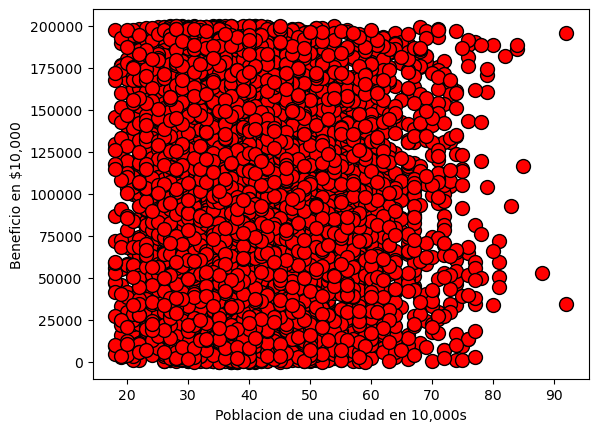

In [12]:
plotData(X, y)

In [9]:
# ?pyplot.plot

# <a id="section2"></a>
### 1.2 Descenso por el gradiente

#### 1.2.1 Ecuaciones de actualización

El objetivo de la regresion lineal es minimizar la funcion de costo

$$ J(\theta) = \frac{1}{2m} \sum_{i=1}^m \left( h_{\theta}(x^{(i)}) - y^{(i)}\right)^2$$

donde la hipotesis $h_\theta(x)$ esta dada por el modelo lineal
$$ h_\theta(x) = \theta^Tx = \theta_0 + \theta_1 x_1$$

Los parametros del modelo son los valores $\theta_j$. Estos son los valores que se ajustaran al costo minimo $J(\theta)$. Un camino para lograr esto es usar el algoritmo por lotes del descenso por el gradiente. En el descenso por el gradiente por lotes, cada iteracion ejecuta una actualizacion
$$ \theta_j = \theta_j - \alpha \frac{1}{m} \sum_{i=1}^m \left( h_\theta(x^{(i)}) - y^{(i)}\right)x_j^{(i)} \qquad \text{actualizacion simultanea } \theta_j \text{ for all } j$$

Con cada paso del descenso por el gradiente, los parametros $\theta_j$ son mas cercanos a los valores optimos que permitiran lograr el costo mas bajo J($\theta$).

#### 1.2.2 Implementación

In [13]:
# Agrega una columna de unos a X. La funcion stack de numpy une matrices a lo largo de un eje dado.
# El primer eje (eje = 0) se refiere a filas (ejemplos de entrenamiento)
# y el segundo eje (eje = 1) se refiere a columnas (características).

X = np.stack([np.ones(m), X], axis=1)

In [14]:
print(X)

[[ 1. 42.]
 [ 1. 41.]
 [ 1. 42.]
 ...
 [ 1. 36.]
 [ 1. 42.]
 [ 1. 28.]]


<a id="section2"></a>
#### 1.2.3 Cálculo del costo $J(\theta)$

In [15]:
def calcularCosto(X, y, theta):
    # inicializa algunos valores importantes
    m = y.size  # numero de ejemplos de entrenamiento

    J = 0
    # h = np.dot(X, theta)
    J = (1/(2 * m)) * np.sum(np.square(np.dot(X, theta) - y))
    return J

Ejemplo de funcionamiento de la funcion computeCoste con dos valores diferentes de $\theta$.

In [16]:
J = calcularCosto(X, y, theta=np.array([0.0, 0.0]))
print('Con theta = [0, 0] \n Costo calculado = %.2f' % J)
# print('Valor de costo esperado (aproximadamente) 32.07\n')

# pruebas adicionales de la función de costes
J = calcularCosto(X, y, theta=np.array([0.5, 0.5]))
print('Con theta = [0.5, 0.5]\n Costo calculado = %.2f' % J)
# print('Valor de costo esperado (aproximadamente)  54.24')

J = calcularCosto(X, y, theta=np.array([0.6, 0.6]))
print('Con theta = [0.6, 0.6]\n Costo calculado = %.2f' % J)

J = calcularCosto(X, y, theta=np.array([0.7, 0.7]))
print('Con theta = [0.7, 0.7]\n Costo calculado = %.2f' % J)

J = calcularCosto(X, y, theta=np.array([0.8, 0.8]))
print('Con theta = [0.8, 0.8]\n Costo calculado = %.2f' % J)

J = calcularCosto(X, y, theta=np.array([0.75, 0.75]))
print('Con theta = [0.75, 0.75]\n Costo calculado = %.2f' % J)

Con theta = [0, 0] 
 Costo calculado = 6662591078.95
Con theta = [0.5, 0.5]
 Costo calculado = 6660595572.11
Con theta = [0.6, 0.6]
 Costo calculado = 6660196521.86
Con theta = [0.7, 0.7]
 Costo calculado = 6659797488.64
Con theta = [0.8, 0.8]
 Costo calculado = 6659398472.46
Con theta = [0.75, 0.75]
 Costo calculado = 6659597978.42


<a id="section3"></a>
#### 1.2.4 Descenso por el gradiente

El costo $J(\theta)$ esta parametrizado por el vector $\theta$, no $X$ y $y$. Donde hay que minimizar el valor de $J(\theta)$ cambiando los valores del vector $\theta$. Una buena manera de verificar si el descenso por el gradiente esta trabajando correctamente es ver los valores de $J(\theta)$ y verificar si estos decresen en cada paso.

<div class="alert alert-box alert-warning">
**Vectores y matrices en `numpy`** - Importantes notas para implementación
Un vector en `numpy` es un array de una diemension, por ejemplo `np.array([1, 2, 3])` es un vector. Una matriz en `numpy` is un arreglo de dos dimensiones, por ejemplo  `np.array([[1, 2, 3], [4, 5, 6]])`. Sin embargo, lo siguiente todavía se considera una matriz `np.array ([[1, 2, 3]])` ya que tiene dos dimensiones, incluso si tiene una forma de 1x3 (que parece un vector).

In [17]:
def gradientDescent(X, y, theta, alpha, num_iters):
        # Inicializa algunos valores importantes
    m = y.shape[0]  # numero de ejemplos de entrenamiento

    # hace una copia de theta, para evitar cambiar la matriz original,
    # ya que las matrices numpy se pasan por referencia a las funciones

    theta = theta.copy()

    J_history = [] # Lista que se utiliza para almacenar el costo en cada iteración

    for i in range(num_iters):
        theta = theta - (alpha / m) * (np.dot(X, theta) - y).dot(X)
        # save the cost J in every iteration
        J_history.append(calcularCosto(X, y, theta))

    return theta, J_history

Se inicializan los parametros $\theta$ con 0 y la taza de aprendizaje $\alpha$ con 0.01.

In [18]:
# inicializa los parametros de ajuste
theta = np.zeros(2)

# configuraciones para el descenso por el gradiente
iterations = 500000
alpha = 0.001

theta, J_history = gradientDescent(X ,y, theta, alpha, iterations)
print('Theta encontrada por descenso gradiente: {:.4f}, {:.4f}'.format(*theta))
print('Valores theta esperados (aproximadamente): [-3.6303, 1.1664]')
print(J_history)

Theta encontrada por descenso gradiente: 101627.1579, -39.4873
Valores theta esperados (aproximadamente): [-3.6303, 1.1664]
[np.float64(3827664189.764097), np.float64(2717327510.7178407), np.float64(2282431965.1887255), np.float64(2112075048.1654096), np.float64(2045325513.1856709), np.float64(2019154136.1095822), np.float64(2008875324.9028766), np.float64(2004820890.524395), np.float64(2003204256.6095219), np.float64(2002542398.7255416), np.float64(2002254485.7317457), np.float64(2002113033.3014774), np.float64(2002028946.4888344), np.float64(2001967330.980109), np.float64(2001914520.3080814), np.float64(2001865161.9577549), np.float64(2001817159.599428), np.float64(2001769692.1985157), np.float64(2001722438.1937406), np.float64(2001675271.644101), np.float64(2001628143.223886), np.float64(2001581033.614004), np.float64(2001533935.247547), np.float64(2001486845.160388), np.float64(2001439762.1910927), np.float64(2001392685.8842578), np.float64(2001345616.0609984), np.float64(200129855

Se utilizan los parametros finales para grafical la linea.

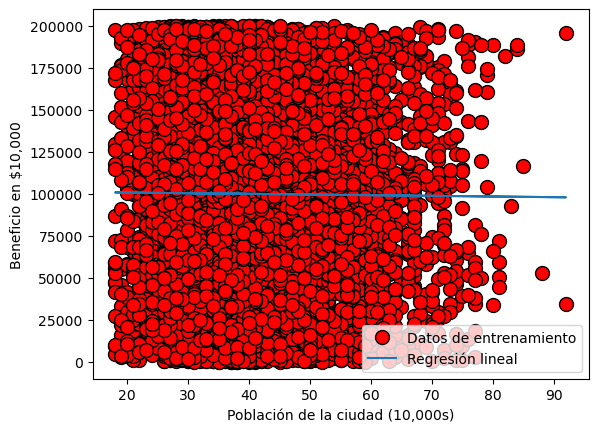

In [19]:
# Graficar los puntos de entrenamiento
pyplot.plot(X[:, 1], y, 'ro', ms=10, mec='k', label='Datos de entrenamiento')

# Graficar la línea de regresión
pyplot.plot(X[:, 1], np.dot(X, theta), '-', label='Regresión lineal')

# Etiquetas y leyenda
pyplot.xlabel('Población de la ciudad (10,000s)')
pyplot.ylabel('Beneficio en $10,000')
pyplot.legend()

# Mostrar la gráfica
pyplot.show()

Los valores finales de $\theta$ se utilizaran para realizar predicciones.

In [23]:
# Predecir valores de beneficio para poblaciones de 35,000 y 70,000
predict1 = np.dot([1, 8.47], theta)
print('Para una población = 84,700, se predice un beneficio de {:.2f}\n'.format(predict1*10000))

predict2 = np.dot([1, 9], theta)
print('Para una población de = 90,000, se predice un beneficio de {:.2f}\n'.format(predict2*10000))

Para una población = 84,700, se predice un beneficio de 1012927002.19

Para una población de = 90,000, se predice un beneficio de 1012717719.33



### 1.4 Visualizar $J(\theta)$

Para comprender mejor la función de costo $J(\theta)$, se graficará la funcion de costo en 2 dimenciones con los valores de $\theta_0$ y $\theta_1$.

El proposito de graficar el costo para observar como $J(\theta)$ varia con cambios en $\theta_0$ y $\theta_1$. La función de costo  $J(\theta)$ tiene forma de una cuenca con un minimo global. (Esto es mas facil observar en los contornos de una superficie 3D). El minimo es el punto optimo para $\theta_0$ y $\theta_1$, en cada paso del descenso por el gradiente se mueve mas cerca a este punto.

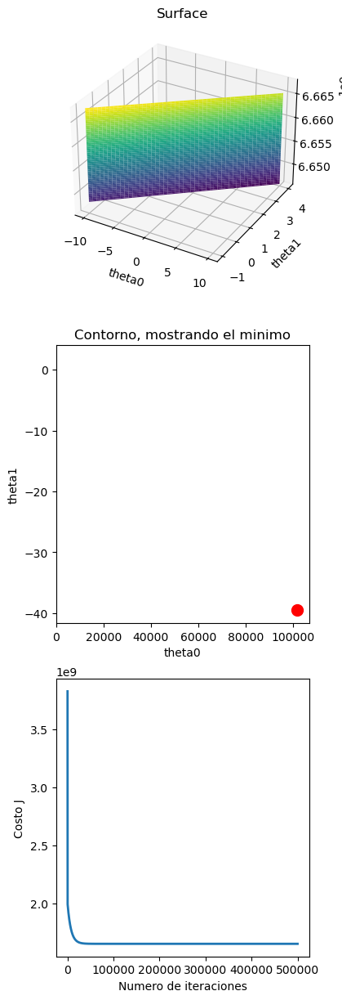

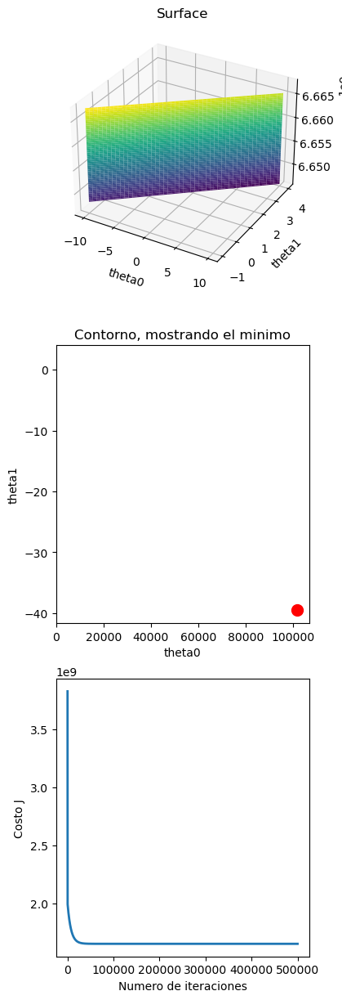

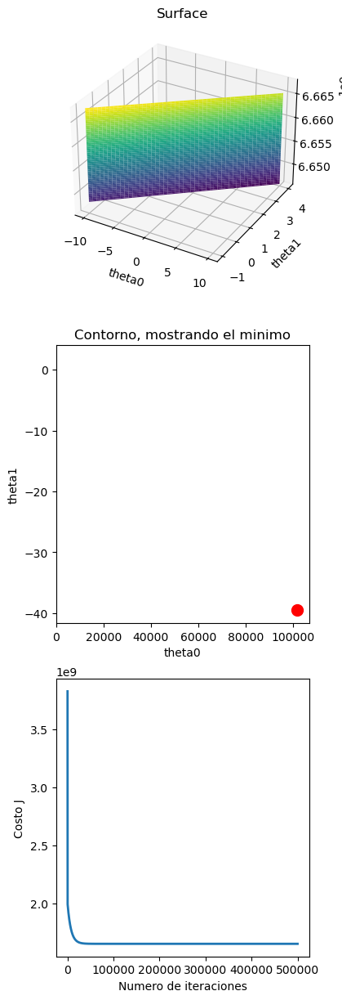

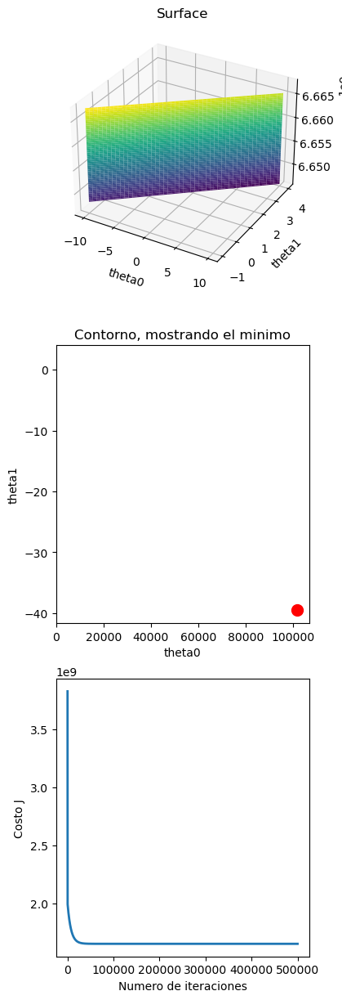

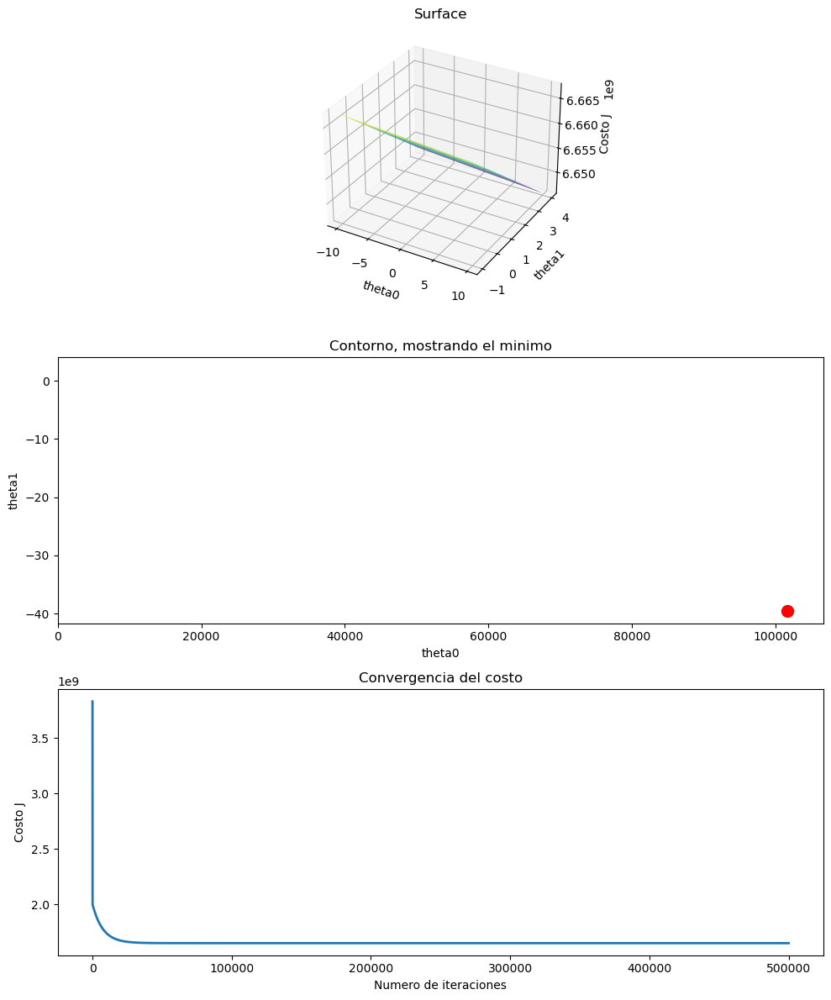

In [26]:
# cuadrícula sobre la que se calcula J
theta0_vals = np.linspace(-10, 10, 50)   # pon 50 en lugar de 100 para que sea más rápido
theta1_vals = np.linspace(-1, 4, 50)

J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

for i, theta0 in enumerate(theta0_vals):
    for j, theta1 in enumerate(theta1_vals):
        J_vals[i, j] = calcularCosto(X, y, [theta0, theta1])

# transponer para que coincida con la malla
J_vals = J_vals.T

# Crear malla 2D
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)

# graficar la superficie
fig = pyplot.figure(figsize=(10, 12))

ax = fig.add_subplot(311, projection='3d')
ax.plot_surface(T0, T1, J_vals, cmap='viridis')
ax.set_xlabel('theta0')
ax.set_ylabel('theta1')
ax.set_zlabel('Costo J')
ax.set_title('Surface')

# graficar contornos
ax2 = fig.add_subplot(312)
CS = ax2.contour(T0, T1, J_vals, linewidths=2, cmap='viridis', levels=np.logspace(-2, 3, 20))
ax2.set_xlabel('theta0')
ax2.set_ylabel('theta1')
ax2.plot(theta[0], theta[1], 'ro', ms=10, lw=2)
ax2.set_title('Contorno, mostrando el minimo')

# graficar convergencia
ax3 = fig.add_subplot(313)
ax3.plot(np.arange(len(J_history)), J_history, lw=2)
ax3.set_xlabel('Numero de iteraciones')
ax3.set_ylabel('Costo J')
ax3.set_title('Convergencia del costo')

pyplot.tight_layout()
pyplot.show()